In [6]:
# ============================================================
# Swin Transformer Tiny 38클래스 학습 코드
# Dataset:
# New Plant Diseases Dataset(Augmented)
# ============================================================

import os
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim

from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

TRAIN_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"

VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

SAVE_CP_PATH = "/home/harry/Re_leaf_Project/cp_swin_t_38cls_finetuned.pth"

SAVE_MODEL_PATH = "/home/harry/Re_leaf_Project/model_swin_t_38cls_finetuned.pth"

CLASS_NAMES_PATH = "/home/harry/Re_leaf_Project/class_names_38_swin.json"

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
LR = 1e-5
SEED = 42
NUM_CLASSES = 38


# ============================================================
# seed 고정
# ============================================================

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(SEED)


# ============================================================
# transform
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# Dataset 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

assert train_dataset.classes == val_dataset.classes, \
    "train / valid 클래스 순서가 다릅니다."

class_names = train_dataset.classes

print("클래스 수:", len(class_names))
print("Train 이미지 수:", len(train_dataset))
print("Valid 이미지 수:", len(val_dataset))

with open(CLASS_NAMES_PATH, "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# Swin Transformer Tiny 모델 생성
# ============================================================

weights = models.Swin_T_Weights.IMAGENET1K_V1

model = models.swin_t(weights=weights)

in_features = model.head.in_features

model.head = nn.Linear(
    in_features,
    NUM_CLASSES
)

model = model.to(DEVICE)

print("Swin Transformer Tiny 모델 생성 완료")


# ============================================================
# Loss / Optimizer
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=1e-4
)


# ============================================================
# 학습 함수
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Train"):

        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)

        correct += (preds == labels).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 검증 함수
# ============================================================

def validate(model, loader, criterion):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in tqdm(loader, desc="Valid"):

            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model(images)

            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)

            correct += (preds == labels).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 학습 실행
# ============================================================

# best_val_acc = 0.0

# for epoch in range(EPOCHS):

#     print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

#     train_loss, train_acc = train_one_epoch(
#         model,
#         train_loader,
#         criterion,
#         optimizer
#     )

#     val_loss, val_acc = validate(
#         model,
#         val_loader,
#         criterion
#     )

#     print(f"Train Loss : {train_loss:.4f}")
#     print(f"Train Acc  : {train_acc:.4f}")

#     print(f"Val Loss   : {val_loss:.4f}")
#     print(f"Val Acc    : {val_acc:.4f}")

#     if val_acc > best_val_acc:

#         best_val_acc = val_acc

#         torch.save(
#             model.state_dict(),
#             SAVE_CP_PATH
#         )

#         print("\nBEST CHECKPOINT 저장 완료")
#         print(SAVE_CP_PATH)
#         print(f"Best Val Acc : {best_val_acc:.4f}")


# # ============================================================
# # 최종 모델 저장
# # ============================================================

# torch.save(
#     model.state_dict(),
#     SAVE_MODEL_PATH
# )

# print("\nSwin 학습 완료")
# print("최종 모델:", SAVE_MODEL_PATH)
# print("BEST CP:", SAVE_CP_PATH)
# print(f"최고 Validation Accuracy: {best_val_acc:.4f}")

클래스 수: 38
Train 이미지 수: 70295
Valid 이미지 수: 17572
Swin Transformer Tiny 모델 생성 완료


/tmp/ipykernel_545/1515862597.py:114: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(
/tmp/ipykernel_545/1515862597.py:139: FutureWarning: You are usi

모델 로드 완료
[0] 사과검은썩음병1.jpg
selected_crop: Apple


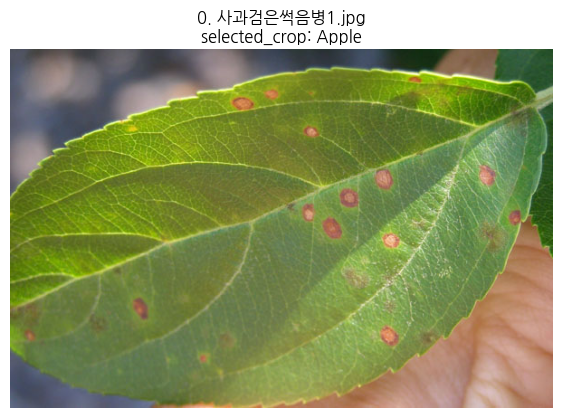

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___Apple_scab,0.9809
1,convnext_38cls,2,Apple___healthy,0.0181
2,convnext_38cls,3,Apple___Black_rot,0.0009
3,convnext_38cls,4,Apple___Cedar_apple_rust,0.0000
4,swin_t_38cls,1,Apple___Cedar_apple_rust,0.9904
5,swin_t_38cls,2,Apple___Apple_scab,0.0064
6,swin_t_38cls,3,Apple___Black_rot,0.0001
7,swin_t_38cls,4,Apple___healthy,0.0000


[1] 사과삼나무사과녹병1.jpg
selected_crop: Apple


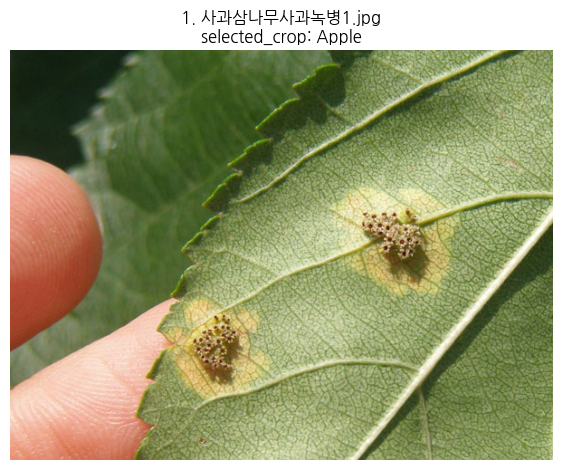

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___healthy,0.0509
1,convnext_38cls,2,Apple___Apple_scab,0.0271
2,convnext_38cls,3,Apple___Black_rot,0.0061
3,convnext_38cls,4,Apple___Cedar_apple_rust,0.0004
4,swin_t_38cls,1,Apple___Black_rot,0.0023
5,swin_t_38cls,2,Apple___Cedar_apple_rust,0.0020
6,swin_t_38cls,3,Apple___healthy,0.0002
7,swin_t_38cls,4,Apple___Apple_scab,0.0001


[2] 사과삼나무사과녹병2.jpg
selected_crop: Apple


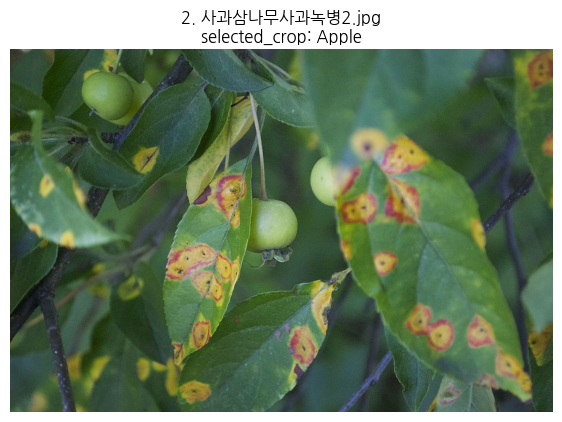

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___Black_rot,0.8958
1,convnext_38cls,2,Apple___Cedar_apple_rust,0.0464
2,convnext_38cls,3,Apple___Apple_scab,0.0271
3,convnext_38cls,4,Apple___healthy,0.0194
4,swin_t_38cls,1,Apple___Black_rot,0.0072
5,swin_t_38cls,2,Apple___Cedar_apple_rust,0.0027
6,swin_t_38cls,3,Apple___Apple_scab,0.0001
7,swin_t_38cls,4,Apple___healthy,0.0000


[3] 옥수수북부잎마름병1.jpg
selected_crop: Corn_(maize)


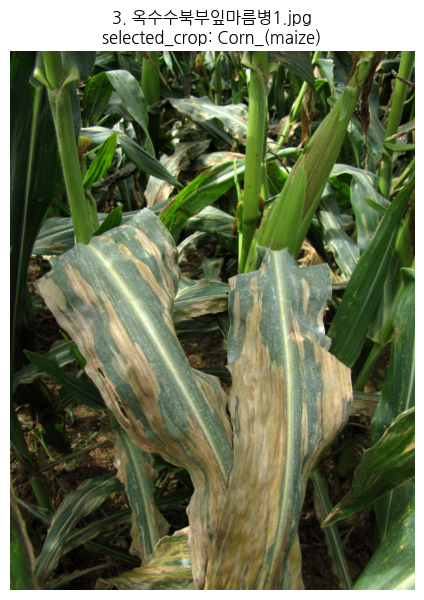

,model,rank,pred_class,confidence
0,convnext_38cls,1,Corn_(maize)___Common_rust_,0.9360
1,convnext_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.0635
2,convnext_38cls,3,Corn_(maize)___healthy,0.0000
3,convnext_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
4,swin_t_38cls,1,Corn_(maize)___Common_rust_,0.3068
5,swin_t_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.1615
6,swin_t_38cls,3,Corn_(maize)___healthy,0.0239
7,swin_t_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0073


[4] 옥수수세르코스포라잎반점병2.jpg
selected_crop: Corn_(maize)


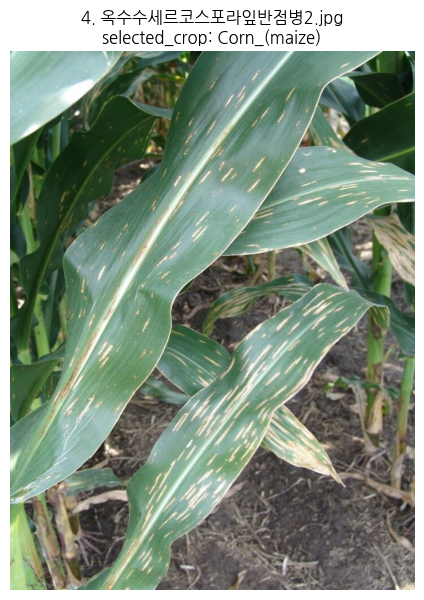

,model,rank,pred_class,confidence
0,convnext_38cls,1,Corn_(maize)___Common_rust_,0.6355
1,convnext_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.3576
2,convnext_38cls,3,Corn_(maize)___healthy,0.0006
3,convnext_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
4,swin_t_38cls,1,Corn_(maize)___Common_rust_,0.5598
5,swin_t_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.0961
6,swin_t_38cls,3,Corn_(maize)___healthy,0.0668
7,swin_t_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0061


[5] 토마토건강1.jpg
selected_crop: Tomato


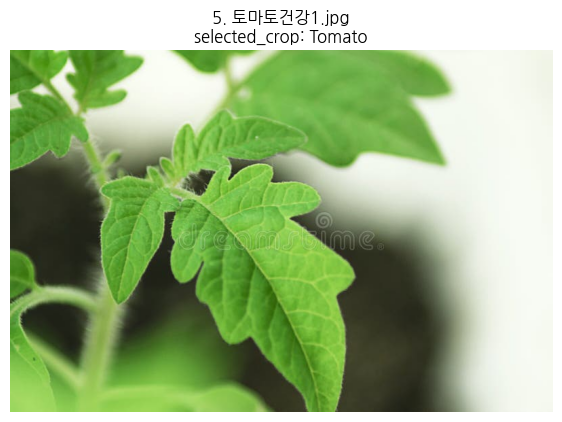

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Late_blight,0.1216
1,convnext_38cls,2,Tomato___Target_Spot,0.0793
2,convnext_38cls,3,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.0004
3,convnext_38cls,4,Tomato___Septoria_leaf_spot,0.0004
4,convnext_38cls,5,Tomato___Early_blight,0.0001
5,swin_t_38cls,1,Tomato___Late_blight,0.8016
6,swin_t_38cls,2,Tomato___healthy,0.1446
7,swin_t_38cls,3,Tomato___Tomato_mosaic_virus,0.0103
8,swin_t_38cls,4,Tomato___Septoria_leaf_spot,0.0018
9,swin_t_38cls,5,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.0003


[6] 토마토건강2.jpg
selected_crop: Tomato


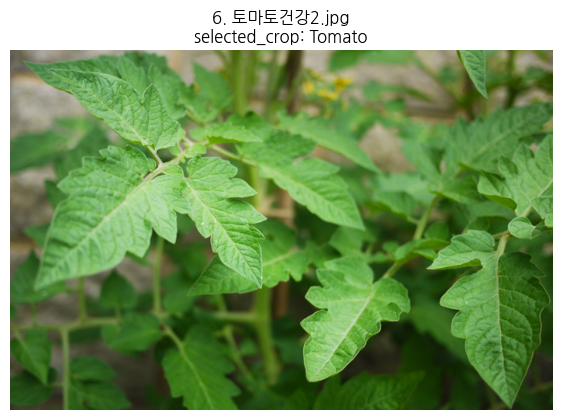

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Target_Spot,0.0004
1,convnext_38cls,2,Tomato___Late_blight,0.0000
2,convnext_38cls,3,Tomato___Septoria_leaf_spot,0.0000
3,convnext_38cls,4,Tomato___Bacterial_spot,0.0000
4,convnext_38cls,5,Tomato___Early_blight,0.0000
5,swin_t_38cls,1,Tomato___Late_blight,0.5275
6,swin_t_38cls,2,Tomato___Septoria_leaf_spot,0.0046
7,swin_t_38cls,3,Tomato___healthy,0.0038
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0019
9,swin_t_38cls,5,Tomato___Early_blight,0.0010


[7] 토마토전기역병1.jpg
selected_crop: Tomato


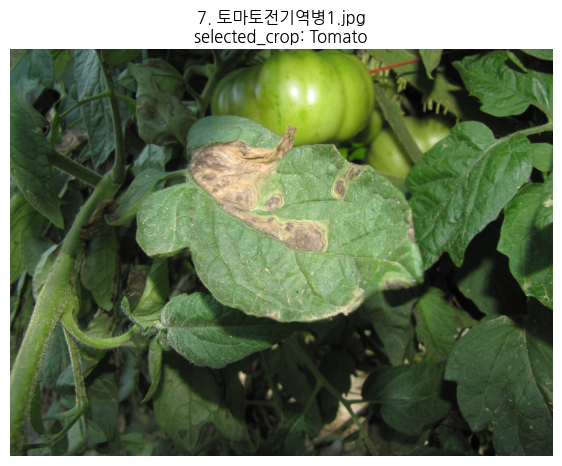

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Late_blight,0.0000
1,convnext_38cls,2,Tomato___healthy,0.0000
2,convnext_38cls,3,Tomato___Early_blight,0.0000
3,convnext_38cls,4,Tomato___Septoria_leaf_spot,0.0000
4,convnext_38cls,5,Tomato___Bacterial_spot,0.0000
5,swin_t_38cls,1,Tomato___Late_blight,0.8188
6,swin_t_38cls,2,Tomato___Septoria_leaf_spot,0.1045
7,swin_t_38cls,3,Tomato___Early_blight,0.0642
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0006
9,swin_t_38cls,5,Tomato___healthy,0.0004


[8] 토마토점무늬병1.jpg
selected_crop: Tomato


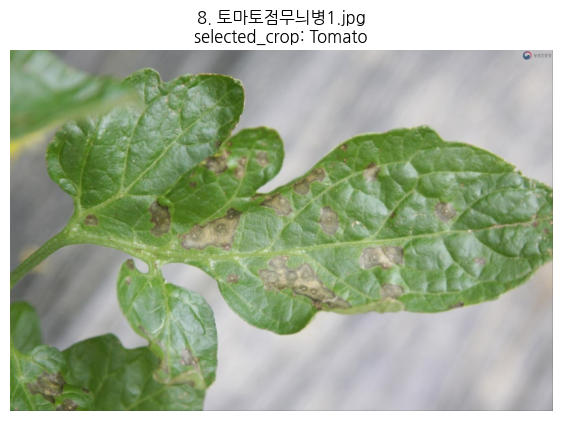

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Target_Spot,0.0000
1,convnext_38cls,2,Tomato___Early_blight,0.0000
2,convnext_38cls,3,Tomato___healthy,0.0000
3,convnext_38cls,4,Tomato___Septoria_leaf_spot,0.0000
4,convnext_38cls,5,Tomato___Late_blight,0.0000
5,swin_t_38cls,1,Tomato___Septoria_leaf_spot,0.0296
6,swin_t_38cls,2,Tomato___Late_blight,0.0079
7,swin_t_38cls,3,Tomato___Early_blight,0.0001
8,swin_t_38cls,4,Tomato___healthy,0.0000
9,swin_t_38cls,5,Tomato___Tomato_mosaic_virus,0.0000


[9] 토마토점무늬병2.webp
selected_crop: Tomato


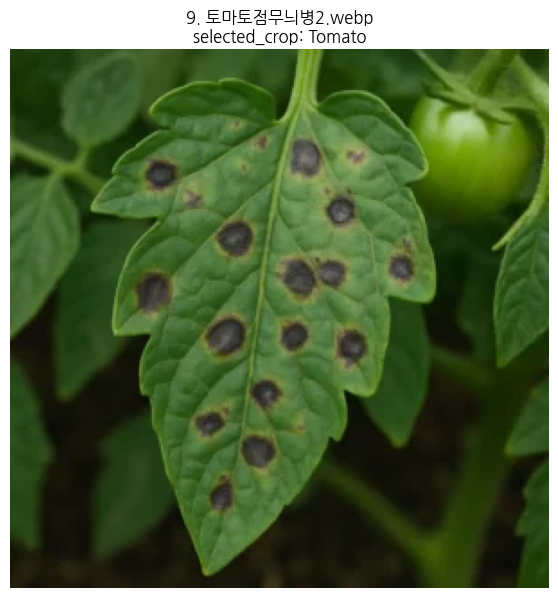

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Late_blight,0.0197
1,convnext_38cls,2,Tomato___Early_blight,0.0032
2,convnext_38cls,3,Tomato___healthy,0.0027
3,convnext_38cls,4,Tomato___Target_Spot,0.0000
4,convnext_38cls,5,Tomato___Septoria_leaf_spot,0.0000
5,swin_t_38cls,1,Tomato___Early_blight,0.4045
6,swin_t_38cls,2,Tomato___Septoria_leaf_spot,0.0394
7,swin_t_38cls,3,Tomato___Late_blight,0.0082
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0019
9,swin_t_38cls,5,Tomato___Leaf_Mold,0.0005


[10] 포도건강1.jpg
selected_crop: Grape


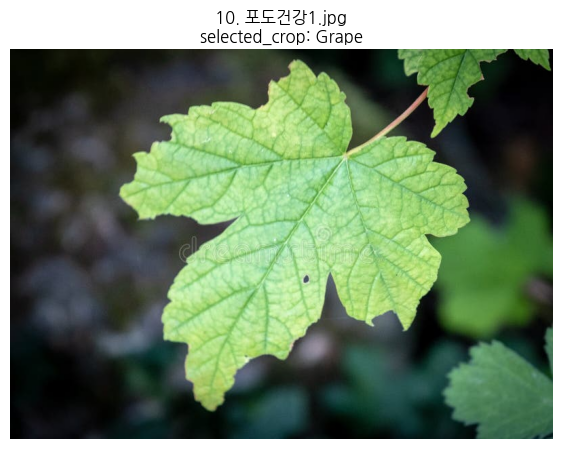

,model,rank,pred_class,confidence
0,convnext_38cls,1,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0005
1,convnext_38cls,2,Grape___healthy,0.0002
2,convnext_38cls,3,Grape___Esca_(Black_Measles),0.0001
3,convnext_38cls,4,Grape___Black_rot,0.0000
4,swin_t_38cls,1,Grape___Black_rot,0.1054
5,swin_t_38cls,2,Grape___healthy,0.0734
6,swin_t_38cls,3,Grape___Esca_(Black_Measles),0.0014
7,swin_t_38cls,4,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0001


[11] 포도잎마름병1.jpg
selected_crop: Grape


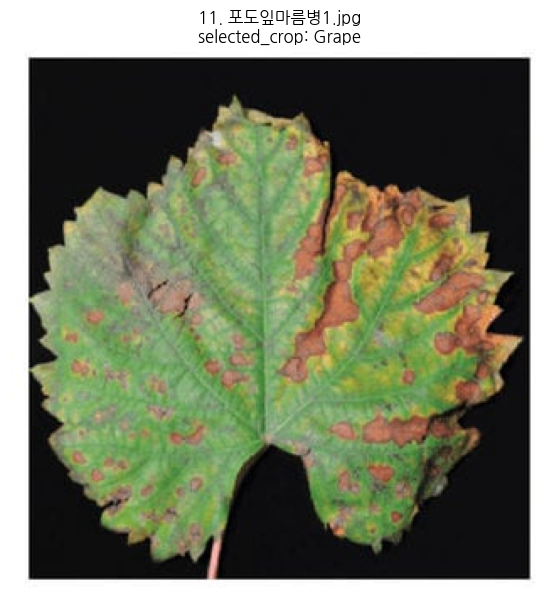

,model,rank,pred_class,confidence
0,convnext_38cls,1,Grape___Esca_(Black_Measles),0.0001
1,convnext_38cls,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0000
2,convnext_38cls,3,Grape___healthy,0.0000
3,convnext_38cls,4,Grape___Black_rot,0.0000
4,swin_t_38cls,1,Grape___Esca_(Black_Measles),0.3341
5,swin_t_38cls,2,Grape___healthy,0.0001
6,swin_t_38cls,3,Grape___Black_rot,0.0000
7,swin_t_38cls,4,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0000


In [4]:
# ============================================================
# ConvNeXt vs Swin 비교 코드
# selected_crop 기준 필터링 Top1~Top5
# ============================================================

import os
import json
import torch
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
import koreanize_matplotlib
from PIL import Image
from pathlib import Path
from torchvision import transforms, models


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CLASS_NAMES_PATH = "/home/harry/Re_leaf_Project/class_names_38.json"

IMG_SIZE = 224
NUM_CLASSES = 38
TOP_K = 5


MODEL_PATHS = {
    "convnext_38cls":
    "/home/harry/Re_leaf_Project/model_convnext_tiny_38cls_finetuned.pth",

    "swin_t_38cls":
    "/home/harry/Re_leaf_Project/cp_swin_t_38cls_finetuned.pth",
}


ambiguous_tests = [

    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과검은썩음병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병2.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg",
        "selected_crop": "Corn_(maize)"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수세르코스포라잎반점병2.jpg",
        "selected_crop": "Corn_(maize)"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강2.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병2.webp",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도건강1.jpg",
        "selected_crop": "Grape"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도잎마름병1.jpg",
        "selected_crop": "Grape"
    },
]


with open(CLASS_NAMES_PATH, "r", encoding="utf-8") as f:
    class_names = json.load(f)


test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


def create_convnext_model(model_path):

    model = models.convnext_tiny(weights=None)

    in_features = model.classifier[2].in_features

    model.classifier[2] = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        model_path,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


def create_swin_model(model_path):

    model = models.swin_t(weights=None)

    in_features = model.head.in_features

    model.head = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        model_path,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


def predict_topk_filtered(
    model,
    image_path,
    selected_crop,
    top_k=5
):

    image = Image.open(image_path).convert("RGB")

    input_tensor = test_transform(image).unsqueeze(0).to(DEVICE)

    crop_indices = [
        idx for idx, class_name in enumerate(class_names)
        if class_name.startswith(selected_crop)
    ]

    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs, dim=1)[0]

        crop_probs = probs[crop_indices]

        actual_top_k = min(top_k, len(crop_indices))

        top_probs, top_local_indices = torch.topk(
            crop_probs,
            k=actual_top_k
        )

    results = []

    for rank, (local_idx, prob) in enumerate(
        zip(
            top_local_indices.cpu().numpy(),
            top_probs.cpu().numpy()
        ),
        start=1
    ):

        original_idx = crop_indices[local_idx]

        results.append({
            "rank": rank,
            "class": class_names[original_idx],
            "confidence": round(float(prob), 4)
        })

    return results


models_dict = {}

models_dict["convnext_38cls"] = create_convnext_model(
    MODEL_PATHS["convnext_38cls"]
)

models_dict["swin_t_38cls"] = create_swin_model(
    MODEL_PATHS["swin_t_38cls"]
)

print("모델 로드 완료")


def show_prediction_by_index(index):

    test_item = ambiguous_tests[index]

    img_path = test_item["img_path"]

    selected_crop = test_item["selected_crop"]

    if not os.path.exists(img_path):
        print("이미지 없음:", img_path)
        return

    image = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(7, 7))
    plt.imshow(image)
    plt.axis("off")
    plt.title(
        f"{index}. {Path(img_path).name}\nselected_crop: {selected_crop}"
    )
    plt.show()

    rows = []

    for model_name, model in models_dict.items():

        pred_results = predict_topk_filtered(
            model=model,
            image_path=img_path,
            selected_crop=selected_crop,
            top_k=TOP_K
        )

        for item in pred_results:

            rows.append({
                "model": model_name,
                "rank": item["rank"],
                "pred_class": item["class"],
                "confidence": item["confidence"]
            })

    result_df = pd.DataFrame(rows)

    display(result_df)

    return result_df


for idx in range(len(ambiguous_tests)):

    print("=" * 100)
    print(f"[{idx}] {Path(ambiguous_tests[idx]['img_path']).name}")
    print("selected_crop:", ambiguous_tests[idx]["selected_crop"])

    show_prediction_by_index(idx)

/tmp/ipykernel_545/4113750189.py:110: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(
/tmp/ipykernel_545/4113750189.py:139: FutureWarning: You are usi

모델 로드 완료

IMAGE: /home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg


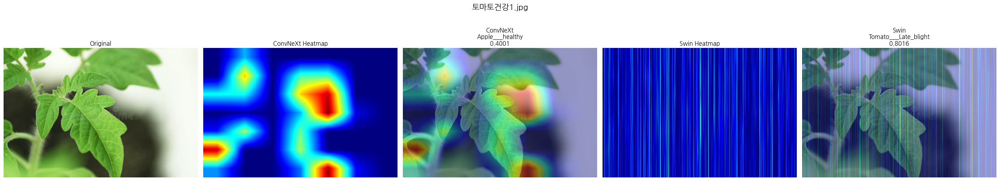


IMAGE: /home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg


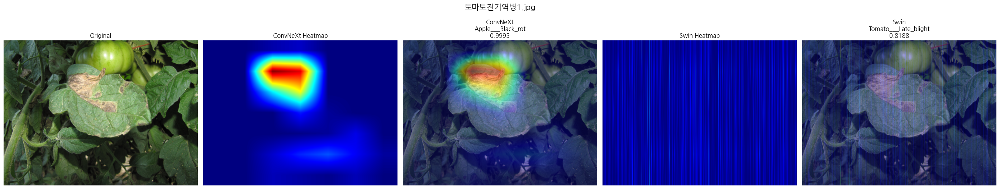


IMAGE: /home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg


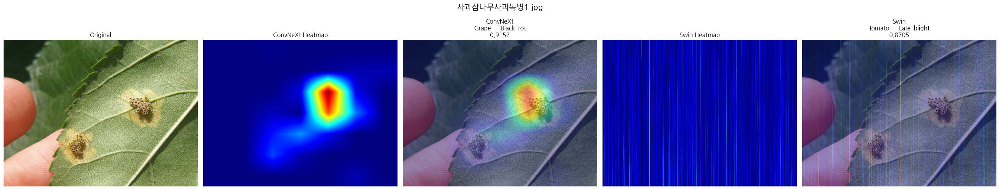


IMAGE: /home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg


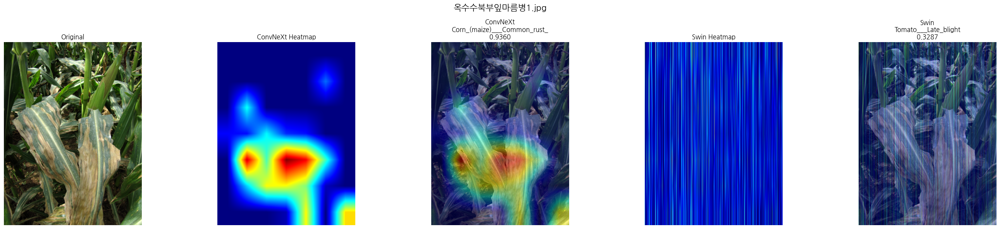

In [5]:
# ============================================================
# ConvNeXt vs Swin Attention Map 비교 코드
#
# 비교 모델:
# 1. ConvNeXt
# 2. Swin Transformer
#
# 같은 이미지에서:
# - 원본
# - ConvNeXt Heatmap
# - ConvNeXt Overlay
# - Swin Heatmap
# - Swin Overlay
#
# 한번에 비교
# ============================================================

import cv2
import json
import torch
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import transforms, models


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMG_SIZE = 224
NUM_CLASSES = 38


# ============================================================
# 모델 경로
# ============================================================

CONVNEXT_MODEL_PATH = \
"/home/harry/Re_leaf_Project/model_convnext_tiny_38cls_finetuned.pth"

SWIN_MODEL_PATH = \
"/home/harry/Re_leaf_Project/cp_swin_t_38cls_finetuned.pth"

CLASS_NAMES_PATH = \
"/home/harry/Re_leaf_Project/class_names_38.json"


# ============================================================
# 테스트 이미지
# ============================================================

TEST_IMAGES = [

    "/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg",

    "/home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg",

    "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg",

    "/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg",
]


# ============================================================
# class names 로드
# ============================================================

with open(CLASS_NAMES_PATH, "r", encoding="utf-8") as f:

    class_names = json.load(f)


# ============================================================
# transform
# ============================================================

transform = transforms.Compose([

    transforms.Resize((IMG_SIZE, IMG_SIZE)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# ConvNeXt 모델 생성
# ============================================================

def create_convnext_model():

    model = models.convnext_tiny(weights=None)

    in_features = model.classifier[2].in_features

    model.classifier[2] = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        CONVNEXT_MODEL_PATH,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


# ============================================================
# Swin 모델 생성
# ============================================================

def create_swin_model():

    model = models.swin_t(weights=None)

    in_features = model.head.in_features

    model.head = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        SWIN_MODEL_PATH,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


# ============================================================
# Grad-CAM 생성 함수
# ============================================================

def generate_gradcam(model, target_layer, input_tensor):

    activations = []
    gradients = []

    # ========================================================
    # Hook 함수
    # ========================================================

    def forward_hook(module, input, output):

        activations.append(output)

    def backward_hook(module, grad_input, grad_output):

        gradients.append(grad_output[0])

    # ========================================================
    # Hook 등록
    # ========================================================

    forward_handle = target_layer.register_forward_hook(
        forward_hook
    )

    backward_handle = target_layer.register_full_backward_hook(
        backward_hook
    )

    # ========================================================
    # Forward
    # ========================================================

    outputs = model(input_tensor)

    pred_idx = outputs.argmax(dim=1).item()

    pred_class = class_names[pred_idx]

    pred_conf = torch.softmax(
        outputs,
        dim=1
    )[0][pred_idx].item()

    # ========================================================
    # Backward
    # ========================================================

    model.zero_grad()

    outputs[0, pred_idx].backward()

    # ========================================================
    # activation / gradient
    # ========================================================

    activation = activations[0].detach().cpu()[0]

    gradient = gradients[0].detach().cpu()[0]

    # ========================================================
    # channel weight 계산
    # ========================================================

    weights = gradient.mean(dim=(1, 2))

    cam = torch.zeros(
        activation.shape[1:],
        dtype=torch.float32
    )

    for i, w in enumerate(weights):

        cam += w * activation[i]

    cam = torch.relu(cam)

    cam -= cam.min()

    cam /= cam.max()

    cam = cam.numpy()

    # ========================================================
    # Hook 제거
    # ========================================================

    forward_handle.remove()

    backward_handle.remove()

    return cam, pred_class, pred_conf


# ============================================================
# 모델 로드
# ============================================================

convnext_model = create_convnext_model()

swin_model = create_swin_model()

print("모델 로드 완료")


# ============================================================
# ConvNeXt / Swin target layer
# ============================================================

convnext_target_layer = convnext_model.features[-1]

swin_target_layer = swin_model.features[-1]


# ============================================================
# 테스트 시작
# ============================================================

for img_path in TEST_IMAGES:

    print("\n" + "=" * 100)

    print("IMAGE:", img_path)

    original_image = Image.open(img_path).convert("RGB")

    original_np = np.array(original_image)

    h, w, _ = original_np.shape

    input_tensor = transform(
        original_image
    ).unsqueeze(0).to(DEVICE)

    # ========================================================
    # ConvNeXt GradCAM
    # ========================================================

    conv_cam, conv_class, conv_conf = generate_gradcam(

        model=convnext_model,

        target_layer=convnext_target_layer,

        input_tensor=input_tensor
    )

    # ========================================================
    # Swin GradCAM
    # ========================================================

    swin_cam, swin_class, swin_conf = generate_gradcam(

        model=swin_model,

        target_layer=swin_target_layer,

        input_tensor=input_tensor
    )

    # ========================================================
    # resize
    # ========================================================

    conv_cam = cv2.resize(conv_cam, (w, h))

    swin_cam = cv2.resize(swin_cam, (w, h))

    # ========================================================
    # heatmap 생성
    # ========================================================

    def make_heatmap(cam):

        heatmap = np.uint8(255 * cam)

        heatmap = cv2.applyColorMap(
            heatmap,
            cv2.COLORMAP_JET
        )

        heatmap = cv2.cvtColor(
            heatmap,
            cv2.COLOR_BGR2RGB
        )

        return heatmap

    conv_heatmap = make_heatmap(conv_cam)

    swin_heatmap = make_heatmap(swin_cam)

    # ========================================================
    # overlay 생성
    # ========================================================

    conv_overlay = (
        conv_heatmap * 0.4 +
        original_np * 0.6
    ).astype(np.uint8)

    swin_overlay = (
        swin_heatmap * 0.4 +
        original_np * 0.6
    ).astype(np.uint8)

    # ========================================================
    # 시각화
    # ========================================================

    fig, axes = plt.subplots(
        1,
        5,
        figsize=(28, 6)
    )

    # ========================================================
    # 원본
    # ========================================================

    axes[0].imshow(original_np)

    axes[0].set_title("Original")

    axes[0].axis("off")

    # ========================================================
    # Conv Heatmap
    # ========================================================

    axes[1].imshow(conv_heatmap)

    axes[1].set_title("ConvNeXt Heatmap")

    axes[1].axis("off")

    # ========================================================
    # Conv Overlay
    # ========================================================

    axes[2].imshow(conv_overlay)

    axes[2].set_title(
        f"ConvNeXt\n{conv_class}\n{conv_conf:.4f}"
    )

    axes[2].axis("off")

    # ========================================================
    # Swin Heatmap
    # ========================================================

    axes[3].imshow(swin_heatmap)

    axes[3].set_title("Swin Heatmap")

    axes[3].axis("off")

    # ========================================================
    # Swin Overlay
    # ========================================================

    axes[4].imshow(swin_overlay)

    axes[4].set_title(
        f"Swin\n{swin_class}\n{swin_conf:.4f}"
    )

    axes[4].axis("off")

    plt.suptitle(
        img_path.split("/")[-1],
        fontsize=16
    )

    plt.tight_layout()

    plt.show()

In [7]:
# ============================================================
# 1.5단계 Swin Fine-tuning
# - 기존 학습된 Swin 모델 로드
# - 마지막 stage + head만 추가학습
# ============================================================

# ============================================================
# 베이스 모델 경로
# ============================================================

BASE_MODEL_PATH = \
"/home/harry/Re_leaf_Project/cp_swin_t_38cls_finetuned.pth"

# ============================================================
# 저장 경로
# ============================================================

SAVE_CP_PATH = \
"/home/harry/Re_leaf_Project/cp_swin_t_38cls_stage1_5_finetuned.pth"

SAVE_MODEL_PATH = \
"/home/harry/Re_leaf_Project/model_swin_t_38cls_stage1_5_finetuned.pth"

# ============================================================
# 모델 다시 생성
# ============================================================

model = models.swin_t(weights=None)

in_features = model.head.in_features

model.head = nn.Linear(
    in_features,
    NUM_CLASSES
)

# ============================================================
# 기존 학습 weight 로드
# ============================================================

state_dict = torch.load(
    BASE_MODEL_PATH,
    map_location=DEVICE
)

model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("기존 Swin 모델 로드 완료")


# ============================================================
# 전체 freeze
# ============================================================

for param in model.parameters():
    param.requires_grad = False

# ============================================================
# 마지막 stage만 학습 허용
# ============================================================

for param in model.features[-1].parameters():
    param.requires_grad = True

# ============================================================
# classifier head 학습 허용
# ============================================================

for param in model.head.parameters():
    param.requires_grad = True


# ============================================================
# optimizer 재설정
# ============================================================

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5,
    weight_decay=1e-4
)

# ============================================================
# epoch 짧게
# ============================================================

EPOCHS = 5

best_val_acc = 0.0


# ============================================================
# 추가 fine-tuning 시작
# ============================================================

for epoch in range(EPOCHS):

    print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss : {train_loss:.4f}")
    print(f"Train Acc  : {train_acc:.4f}")

    print(f"Val Loss   : {val_loss:.4f}")
    print(f"Val Acc    : {val_acc:.4f}")

    # ========================================================
    # BEST CHECKPOINT 저장
    # ========================================================

    if val_acc > best_val_acc:

        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            SAVE_CP_PATH
        )

        print("\nBEST CHECKPOINT 저장 완료")
        print(SAVE_CP_PATH)

        print(f"Best Val Acc : {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(
    model.state_dict(),
    SAVE_MODEL_PATH
)

print("\n1.5단계 Fine-tuning 완료")

print("MODEL:")
print(SAVE_MODEL_PATH)

print("\nBEST CP:")
print(SAVE_CP_PATH)

/tmp/ipykernel_545/1898068066.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(


기존 Swin 모델 로드 완료

Epoch [1/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:37<00:00, 14.69it/s]


Train Loss : 0.0034
Train Acc  : 0.9994
Val Loss   : 0.0033
Val Acc    : 0.9993

BEST CHECKPOINT 저장 완료
/home/harry/Re_leaf_Project/cp_swin_t_38cls_stage1_5_finetuned.pth
Best Val Acc : 0.9993

Epoch [2/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:37<00:00, 14.77it/s]


Train Loss : 0.0026
Train Acc  : 0.9995
Val Loss   : 0.0036
Val Acc    : 0.9991

Epoch [3/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:37<00:00, 14.74it/s]


Train Loss : 0.0027
Train Acc  : 0.9995
Val Loss   : 0.0035
Val Acc    : 0.9992

Epoch [4/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:37<00:00, 14.83it/s]


Train Loss : 0.0019
Train Acc  : 0.9996
Val Loss   : 0.0041
Val Acc    : 0.9990

Epoch [5/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:40<00:00, 13.71it/s]

Train Loss : 0.0021
Train Acc  : 0.9996
Val Loss   : 0.0040
Val Acc    : 0.9991

1.5단계 Fine-tuning 완료
MODEL:
/home/harry/Re_leaf_Project/model_swin_t_38cls_stage1_5_finetuned.pth

BEST CP:
/home/harry/Re_leaf_Project/cp_swin_t_38cls_stage1_5_finetuned.pth


In [8]:

# ============================================================
# 2단계 Swin Fine-tuning
# - 1.5단계 Swin 모델 로드
# - real38 원본 이미지 추가학습
# ============================================================

# ============================================================
# 데이터 경로
# ============================================================

TRAIN_DIR = "/home/harry/Re_leaf_Project/real_crop_38cls_quality_crawl"

VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"


# ============================================================
# 베이스 모델
# ============================================================

BASE_MODEL_PATH = \
"/home/harry/Re_leaf_Project/cp_swin_t_38cls_stage1_5_finetuned.pth"


# ============================================================
# 저장 경로
# ============================================================

SAVE_CP_PATH = \
"/home/harry/Re_leaf_Project/cp_swin_t_38cls_realmix_finetuned.pth"

SAVE_MODEL_PATH = \
"/home/harry/Re_leaf_Project/model_swin_t_38cls_realmix_finetuned.pth"


# ============================================================
# Dataset 다시 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

assert train_dataset.classes == val_dataset.classes, \
    "real38 train과 valid 클래스 순서가 다릅니다."

print("클래스 수:", len(train_dataset.classes))
print("real38 train 이미지 수:", len(train_dataset))
print("원본 valid 이미지 수:", len(val_dataset))

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# Swin 모델 다시 생성
# ============================================================

model = models.swin_t(weights=None)

in_features = model.head.in_features

model.head = nn.Linear(
    in_features,
    NUM_CLASSES
)


# ============================================================
# 1.5단계 모델 로드
# ============================================================

state_dict = torch.load(
    BASE_MODEL_PATH,
    map_location=DEVICE
)

model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("1.5단계 Swin 모델 로드 완료")
print(BASE_MODEL_PATH)


# ============================================================
# Fine-tuning 설정
# 마지막 stage + head만 학습
# ============================================================

for param in model.parameters():
    param.requires_grad = False

for param in model.features[-1].parameters():
    param.requires_grad = True

for param in model.head.parameters():
    param.requires_grad = True


# ============================================================
# optimizer 재설정
# ============================================================

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5,
    weight_decay=1e-4
)


# ============================================================
# 2단계는 real 데이터 추가학습이라 짧게
# ============================================================

EPOCHS = 5

best_val_acc = 0.0


# ============================================================
# 추가학습 실행
# ============================================================

for epoch in range(EPOCHS):

    print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss : {train_loss:.4f}")
    print(f"Train Acc  : {train_acc:.4f}")

    print(f"Val Loss   : {val_loss:.4f}")
    print(f"Val Acc    : {val_acc:.4f}")

    if val_acc > best_val_acc:

        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            SAVE_CP_PATH
        )

        print("\nBEST CHECKPOINT 저장 완료")
        print(SAVE_CP_PATH)
        print(f"Best Val Acc : {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(
    model.state_dict(),
    SAVE_MODEL_PATH
)

print("\n2단계 Swin real38 추가학습 완료")

print("MODEL:")
print(SAVE_MODEL_PATH)

print("\nBEST CP:")
print(SAVE_CP_PATH)

print(f"\n최고 Validation Accuracy: {best_val_acc:.4f}")

클래스 수: 38
real38 train 이미지 수: 717
원본 valid 이미지 수: 17572


/tmp/ipykernel_545/1859842735.py:91: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(


1.5단계 Swin 모델 로드 완료
/home/harry/Re_leaf_Project/cp_swin_t_38cls_stage1_5_finetuned.pth

Epoch [1/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:36<00:00, 14.99it/s]


Train Loss : 3.6134
Train Acc  : 0.3905
Val Loss   : 0.0034
Val Acc    : 0.9991

BEST CHECKPOINT 저장 완료
/home/harry/Re_leaf_Project/cp_swin_t_38cls_realmix_finetuned.pth
Best Val Acc : 0.9991

Epoch [2/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:36<00:00, 15.00it/s]


Train Loss : 3.0691
Train Acc  : 0.4254
Val Loss   : 0.0035
Val Acc    : 0.9991

Epoch [3/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:36<00:00, 14.99it/s]


Train Loss : 2.7844
Train Acc  : 0.4728
Val Loss   : 0.0037
Val Acc    : 0.9990

Epoch [4/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:36<00:00, 14.98it/s]


Train Loss : 2.4455
Train Acc  : 0.4854
Val Loss   : 0.0039
Val Acc    : 0.9990

Epoch [5/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:36<00:00, 14.95it/s]


Train Loss : 2.2453
Train Acc  : 0.4993
Val Loss   : 0.0042
Val Acc    : 0.9989

2단계 Swin real38 추가학습 완료
MODEL:
/home/harry/Re_leaf_Project/model_swin_t_38cls_realmix_finetuned.pth

BEST CP:
/home/harry/Re_leaf_Project/cp_swin_t_38cls_realmix_finetuned.pth

최고 Validation Accuracy: 0.9991


/tmp/ipykernel_545/1460880576.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(
/tmp/ipykernel_545/1460880576.py:113: FutureWarning: You are usin

모델 로드 완료
[0] 사과검은썩음병1.jpg
selected_crop: Apple


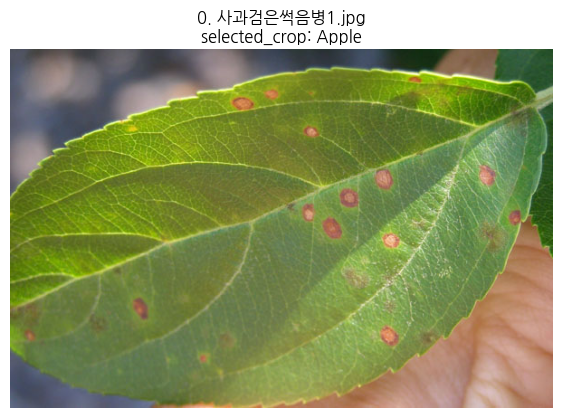

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___Apple_scab,0.2839
1,convnext_38cls,2,Apple___healthy,0.0996
2,convnext_38cls,3,Apple___Black_rot,0.0403
3,convnext_38cls,4,Apple___Cedar_apple_rust,0.0019
4,swin_t_38cls,1,Apple___Cedar_apple_rust,0.9839
5,swin_t_38cls,2,Apple___Apple_scab,0.0130
6,swin_t_38cls,3,Apple___Black_rot,0.0001
7,swin_t_38cls,4,Apple___healthy,0.0001


[1] 사과삼나무사과녹병1.jpg
selected_crop: Apple


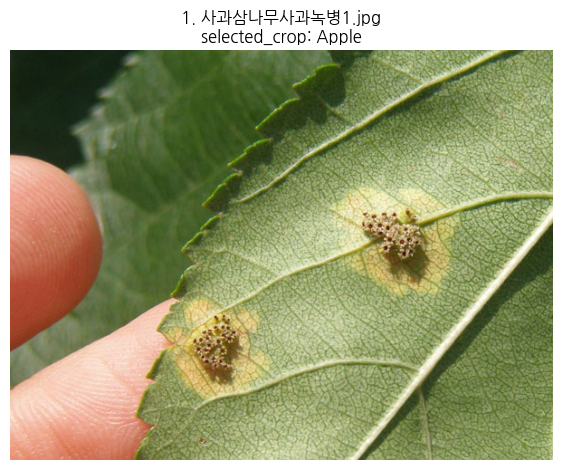

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___healthy,0.0006
1,convnext_38cls,2,Apple___Black_rot,0.0002
2,convnext_38cls,3,Apple___Apple_scab,0.0001
3,convnext_38cls,4,Apple___Cedar_apple_rust,0.0001
4,swin_t_38cls,1,Apple___Cedar_apple_rust,0.0040
5,swin_t_38cls,2,Apple___Black_rot,0.0031
6,swin_t_38cls,3,Apple___healthy,0.0003
7,swin_t_38cls,4,Apple___Apple_scab,0.0002


[2] 사과삼나무사과녹병2.jpg
selected_crop: Apple


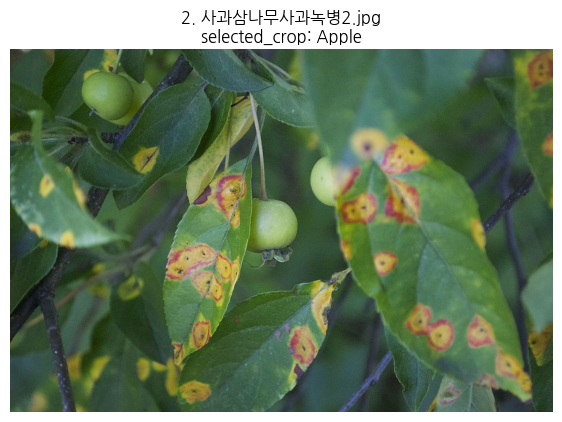

,model,rank,pred_class,confidence
0,convnext_38cls,1,Apple___Black_rot,0.0317
1,convnext_38cls,2,Apple___Cedar_apple_rust,0.0234
2,convnext_38cls,3,Apple___healthy,0.0025
3,convnext_38cls,4,Apple___Apple_scab,0.0025
4,swin_t_38cls,1,Apple___Black_rot,0.0229
5,swin_t_38cls,2,Apple___Cedar_apple_rust,0.0062
6,swin_t_38cls,3,Apple___Apple_scab,0.0002
7,swin_t_38cls,4,Apple___healthy,0.0001


[3] 옥수수북부잎마름병1.jpg
selected_crop: Corn_(maize)


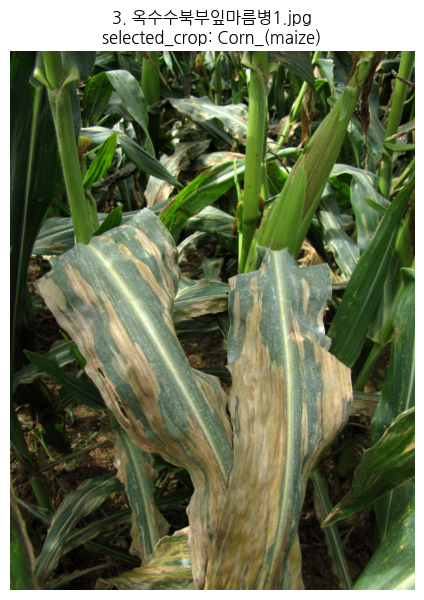

,model,rank,pred_class,confidence
0,convnext_38cls,1,Corn_(maize)___Common_rust_,0.7128
1,convnext_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.2870
2,convnext_38cls,3,Corn_(maize)___healthy,0.0000
3,convnext_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
4,swin_t_38cls,1,Corn_(maize)___Northern_Leaf_Blight,0.3873
5,swin_t_38cls,2,Corn_(maize)___Common_rust_,0.2836
6,swin_t_38cls,3,Corn_(maize)___healthy,0.0178
7,swin_t_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0036


[4] 옥수수세르코스포라잎반점병2.jpg
selected_crop: Corn_(maize)


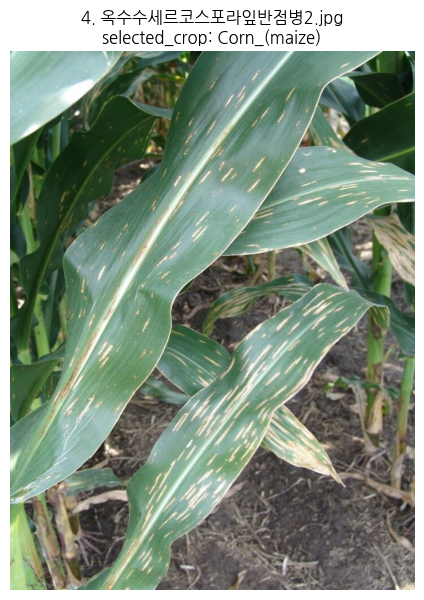

,model,rank,pred_class,confidence
0,convnext_38cls,1,Corn_(maize)___Northern_Leaf_Blight,0.5758
1,convnext_38cls,2,Corn_(maize)___Common_rust_,0.4132
2,convnext_38cls,3,Corn_(maize)___healthy,0.0026
3,convnext_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0020
4,swin_t_38cls,1,Corn_(maize)___Common_rust_,0.6658
5,swin_t_38cls,2,Corn_(maize)___Northern_Leaf_Blight,0.0994
6,swin_t_38cls,3,Corn_(maize)___healthy,0.0523
7,swin_t_38cls,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0044


[5] 토마토건강1.jpg
selected_crop: Tomato


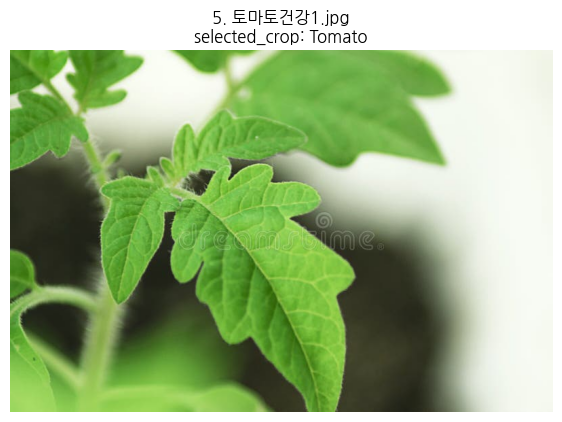

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___healthy,0.2744
1,convnext_38cls,2,Tomato___Target_Spot,0.1630
2,convnext_38cls,3,Tomato___Late_blight,0.1502
3,convnext_38cls,4,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.1317
4,convnext_38cls,5,Tomato___Tomato_mosaic_virus,0.0614
5,swin_t_38cls,1,Tomato___Late_blight,0.6872
6,swin_t_38cls,2,Tomato___healthy,0.2866
7,swin_t_38cls,3,Tomato___Tomato_mosaic_virus,0.0064
8,swin_t_38cls,4,Tomato___Septoria_leaf_spot,0.0006
9,swin_t_38cls,5,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.0005


[6] 토마토건강2.jpg
selected_crop: Tomato


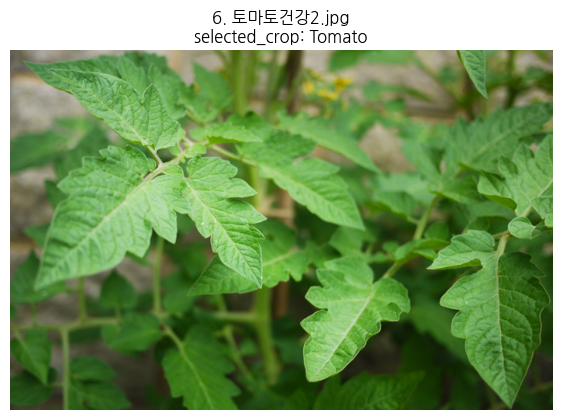

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Target_Spot,0.0719
1,convnext_38cls,2,Tomato___healthy,0.0003
2,convnext_38cls,3,Tomato___Spider_mites Two-spotted_spider_mite,0.0002
3,convnext_38cls,4,Tomato___Late_blight,0.0001
4,convnext_38cls,5,Tomato___Bacterial_spot,0.0001
5,swin_t_38cls,1,Tomato___Late_blight,0.6677
6,swin_t_38cls,2,Tomato___healthy,0.0093
7,swin_t_38cls,3,Tomato___Septoria_leaf_spot,0.0034
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0026
9,swin_t_38cls,5,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.0012


[7] 토마토전기역병1.jpg
selected_crop: Tomato


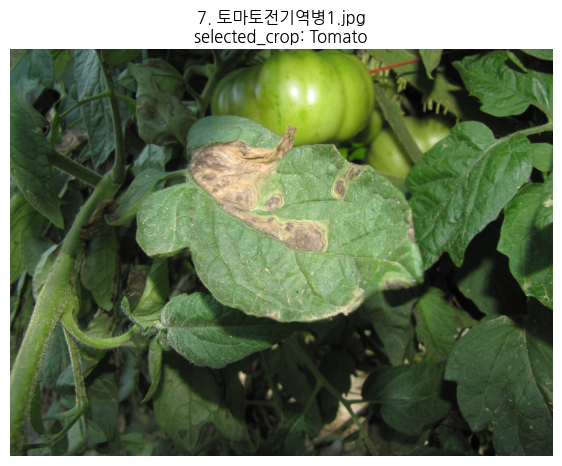

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___healthy,0.0322
1,convnext_38cls,2,Tomato___Late_blight,0.0113
2,convnext_38cls,3,Tomato___Septoria_leaf_spot,0.0057
3,convnext_38cls,4,Tomato___Early_blight,0.0054
4,convnext_38cls,5,Tomato___Bacterial_spot,0.0020
5,swin_t_38cls,1,Tomato___Late_blight,0.8419
6,swin_t_38cls,2,Tomato___Early_blight,0.0871
7,swin_t_38cls,3,Tomato___Septoria_leaf_spot,0.0601
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0007
9,swin_t_38cls,5,Tomato___healthy,0.0006


[8] 토마토점무늬병1.jpg
selected_crop: Tomato


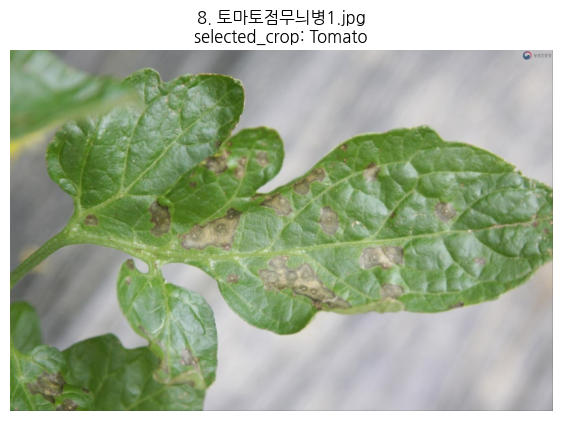

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___Target_Spot,0.1753
1,convnext_38cls,2,Tomato___healthy,0.0599
2,convnext_38cls,3,Tomato___Early_blight,0.0478
3,convnext_38cls,4,Tomato___Septoria_leaf_spot,0.0022
4,convnext_38cls,5,Tomato___Late_blight,0.0008
5,swin_t_38cls,1,Tomato___Septoria_leaf_spot,0.0966
6,swin_t_38cls,2,Tomato___Late_blight,0.0218
7,swin_t_38cls,3,Tomato___Early_blight,0.0003
8,swin_t_38cls,4,Tomato___healthy,0.0000
9,swin_t_38cls,5,Tomato___Tomato_mosaic_virus,0.0000


[9] 토마토점무늬병2.webp
selected_crop: Tomato


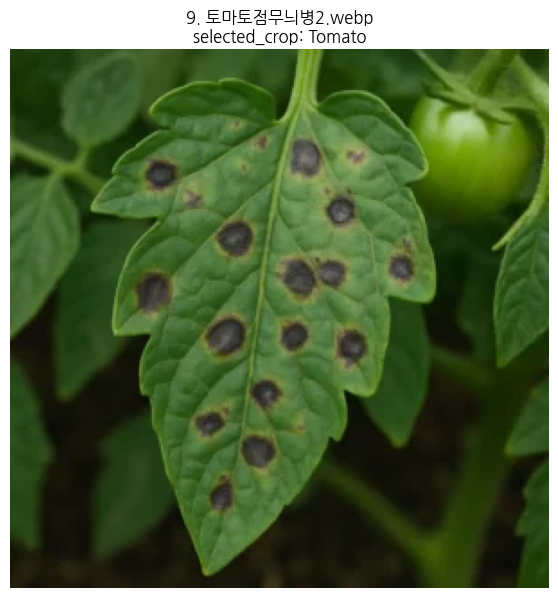

,model,rank,pred_class,confidence
0,convnext_38cls,1,Tomato___healthy,0.4444
1,convnext_38cls,2,Tomato___Late_blight,0.1947
2,convnext_38cls,3,Tomato___Leaf_Mold,0.0485
3,convnext_38cls,4,Tomato___Early_blight,0.0224
4,convnext_38cls,5,Tomato___Spider_mites Two-spotted_spider_mite,0.0078
5,swin_t_38cls,1,Tomato___Early_blight,0.4462
6,swin_t_38cls,2,Tomato___Septoria_leaf_spot,0.0790
7,swin_t_38cls,3,Tomato___Late_blight,0.0123
8,swin_t_38cls,4,Tomato___Tomato_mosaic_virus,0.0037
9,swin_t_38cls,5,Tomato___Leaf_Mold,0.0011


[10] 포도건강1.jpg
selected_crop: Grape


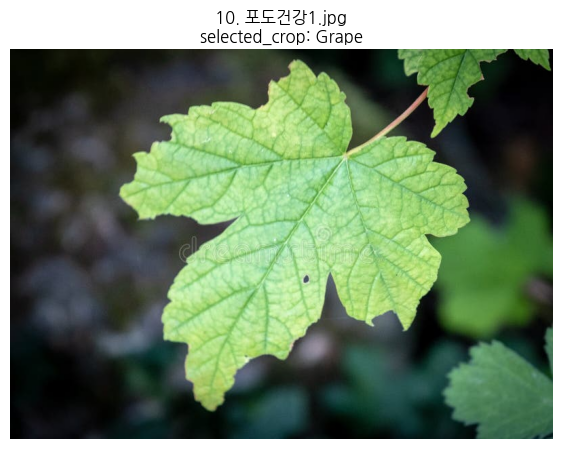

,model,rank,pred_class,confidence
0,convnext_38cls,1,Grape___healthy,0.1017
1,convnext_38cls,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0785
2,convnext_38cls,3,Grape___Esca_(Black_Measles),0.0365
3,convnext_38cls,4,Grape___Black_rot,0.0000
4,swin_t_38cls,1,Grape___Black_rot,0.1021
5,swin_t_38cls,2,Grape___healthy,0.0976
6,swin_t_38cls,3,Grape___Esca_(Black_Measles),0.0014
7,swin_t_38cls,4,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0001


[11] 포도잎마름병1.jpg
selected_crop: Grape


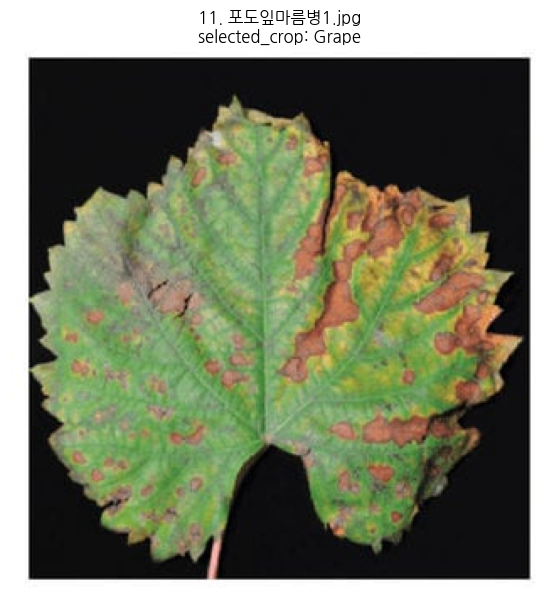

,model,rank,pred_class,confidence
0,convnext_38cls,1,Grape___Esca_(Black_Measles),0.0030
1,convnext_38cls,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0013
2,convnext_38cls,3,Grape___healthy,0.0000
3,convnext_38cls,4,Grape___Black_rot,0.0000
4,swin_t_38cls,1,Grape___Esca_(Black_Measles),0.3805
5,swin_t_38cls,2,Grape___healthy,0.0002
6,swin_t_38cls,3,Grape___Black_rot,0.0001
7,swin_t_38cls,4,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0000


In [9]:
MODEL_PATHS = {
    "convnext_38cls":
    "/home/harry/Re_leaf_Project/cp_convnext_tiny_38cls_realmix_finetuned.pth",

    "swin_t_38cls":
    "/home/harry/Re_leaf_Project/cp_swin_t_38cls_realmix_finetuned.pth",
}


ambiguous_tests = [

    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과검은썩음병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병2.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg",
        "selected_crop": "Corn_(maize)"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수세르코스포라잎반점병2.jpg",
        "selected_crop": "Corn_(maize)"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강2.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병2.webp",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도건강1.jpg",
        "selected_crop": "Grape"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도잎마름병1.jpg",
        "selected_crop": "Grape"
    },
]


with open(CLASS_NAMES_PATH, "r", encoding="utf-8") as f:
    class_names = json.load(f)


test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


def create_convnext_model(model_path):

    model = models.convnext_tiny(weights=None)

    in_features = model.classifier[2].in_features

    model.classifier[2] = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        model_path,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


def create_swin_model(model_path):

    model = models.swin_t(weights=None)

    in_features = model.head.in_features

    model.head = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        model_path,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


def predict_topk_filtered(
    model,
    image_path,
    selected_crop,
    top_k=5
):

    image = Image.open(image_path).convert("RGB")

    input_tensor = test_transform(image).unsqueeze(0).to(DEVICE)

    crop_indices = [
        idx for idx, class_name in enumerate(class_names)
        if class_name.startswith(selected_crop)
    ]

    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs, dim=1)[0]

        crop_probs = probs[crop_indices]

        actual_top_k = min(top_k, len(crop_indices))

        top_probs, top_local_indices = torch.topk(
            crop_probs,
            k=actual_top_k
        )

    results = []

    for rank, (local_idx, prob) in enumerate(
        zip(
            top_local_indices.cpu().numpy(),
            top_probs.cpu().numpy()
        ),
        start=1
    ):

        original_idx = crop_indices[local_idx]

        results.append({
            "rank": rank,
            "class": class_names[original_idx],
            "confidence": round(float(prob), 4)
        })

    return results


models_dict = {}

models_dict["convnext_38cls"] = create_convnext_model(
    MODEL_PATHS["convnext_38cls"]
)

models_dict["swin_t_38cls"] = create_swin_model(
    MODEL_PATHS["swin_t_38cls"]
)

print("모델 로드 완료")


def show_prediction_by_index(index):

    test_item = ambiguous_tests[index]

    img_path = test_item["img_path"]

    selected_crop = test_item["selected_crop"]

    if not os.path.exists(img_path):
        print("이미지 없음:", img_path)
        return

    image = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(7, 7))
    plt.imshow(image)
    plt.axis("off")
    plt.title(
        f"{index}. {Path(img_path).name}\nselected_crop: {selected_crop}"
    )
    plt.show()

    rows = []

    for model_name, model in models_dict.items():

        pred_results = predict_topk_filtered(
            model=model,
            image_path=img_path,
            selected_crop=selected_crop,
            top_k=TOP_K
        )

        for item in pred_results:

            rows.append({
                "model": model_name,
                "rank": item["rank"],
                "pred_class": item["class"],
                "confidence": item["confidence"]
            })

    result_df = pd.DataFrame(rows)

    display(result_df)

    return result_df


for idx in range(len(ambiguous_tests)):

    print("=" * 100)
    print(f"[{idx}] {Path(ambiguous_tests[idx]['img_path']).name}")
    print("selected_crop:", ambiguous_tests[idx]["selected_crop"])

    show_prediction_by_index(idx)